# TF-IDF
Term Frequency - Inverse Document Frequency   

TF-IDF (Term Frequency - Inverse Document Frequency) is a handy algorithm that uses the frequency of words to determine how relevant those words are to a given document. It's a relatively simple but intuitive approach to weighting words, allowing it to act as a great jumping off point for a variety of tasks.

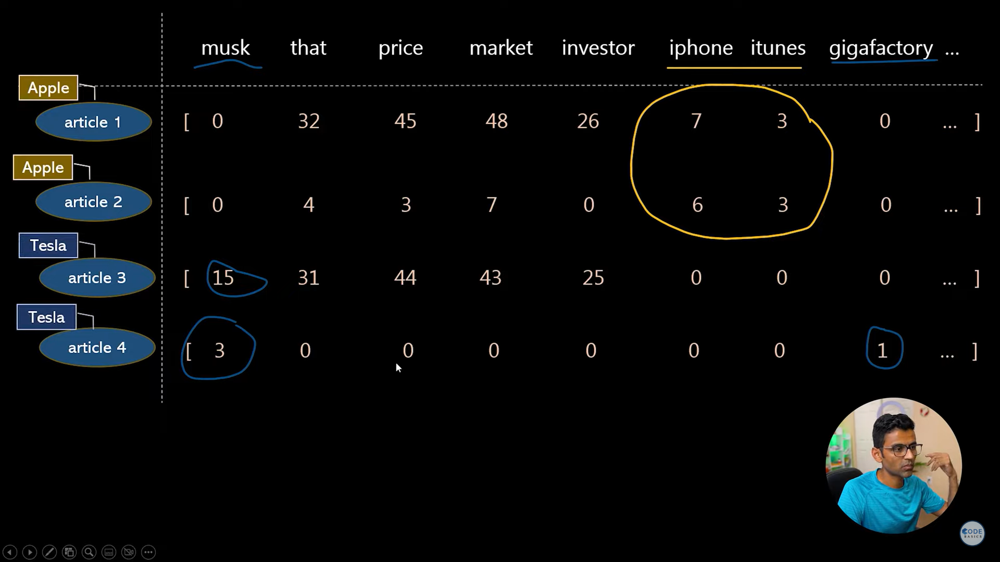
Here, we can observe that there are words such as **iphone** and **itunes** in article 1 and article 2, hence we can consider that those two articles belongs to **Apple**.          

Similarly, in the next two articles there are words such as **musk** and **gigafactory**, hence we can consider that those two articles belongs to **Tesla**.

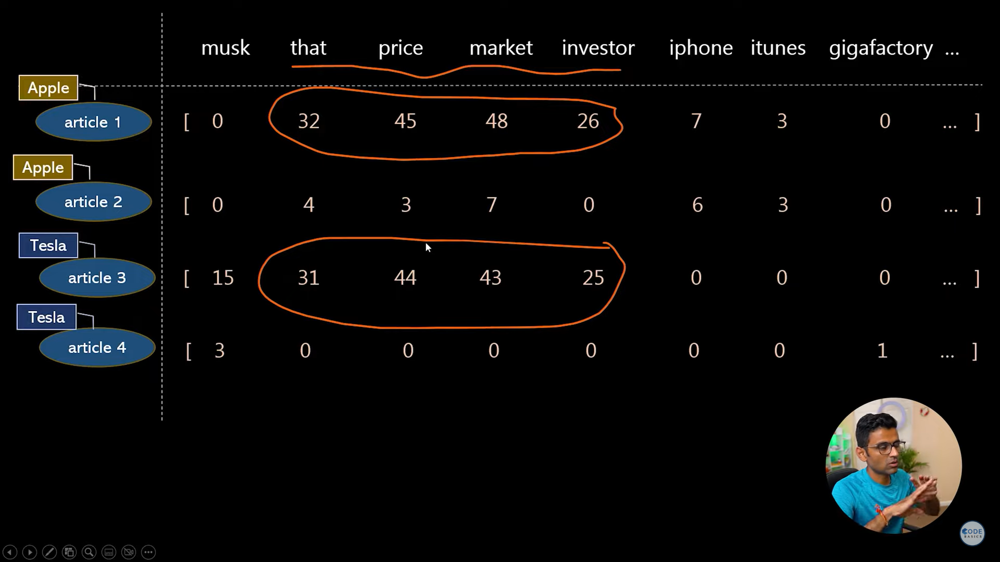
Here, the words such as 'that', 'price', 'market', 'investor' are common and hence there is very less significance of these words.

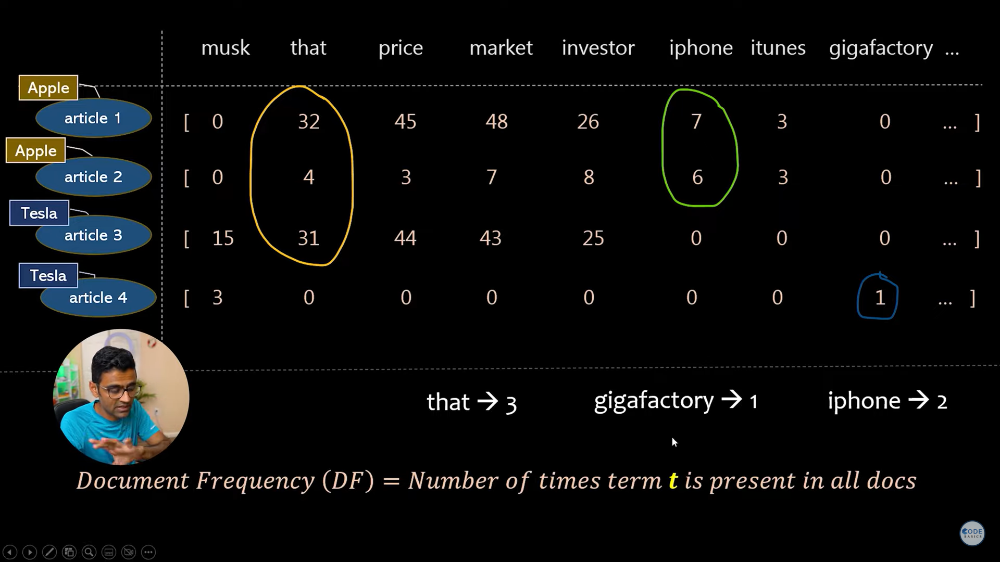

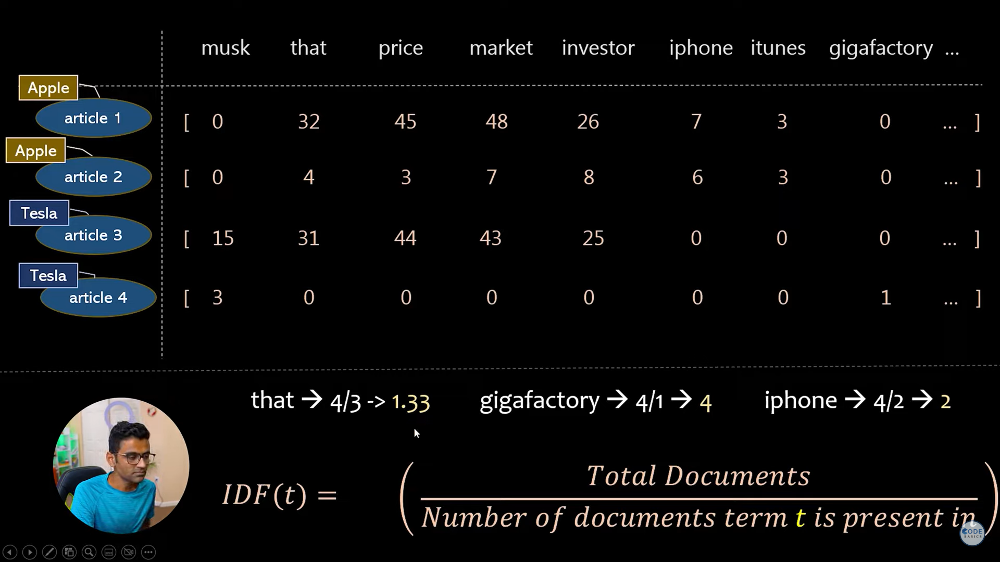
We can see that as that Document Frequency(DF) is increasing, the value of IDF is decreasing and vise versa.

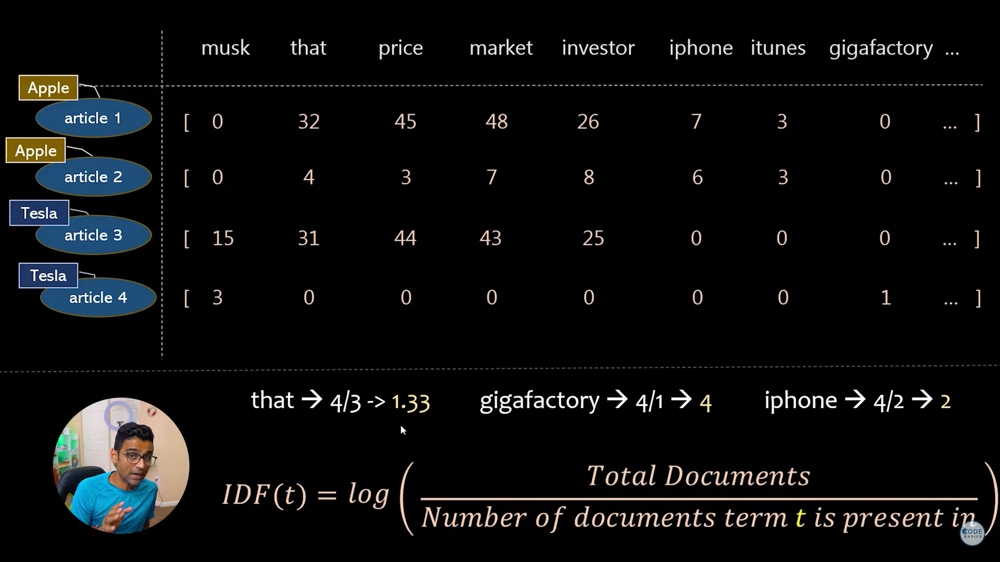
Log is added to the formula.

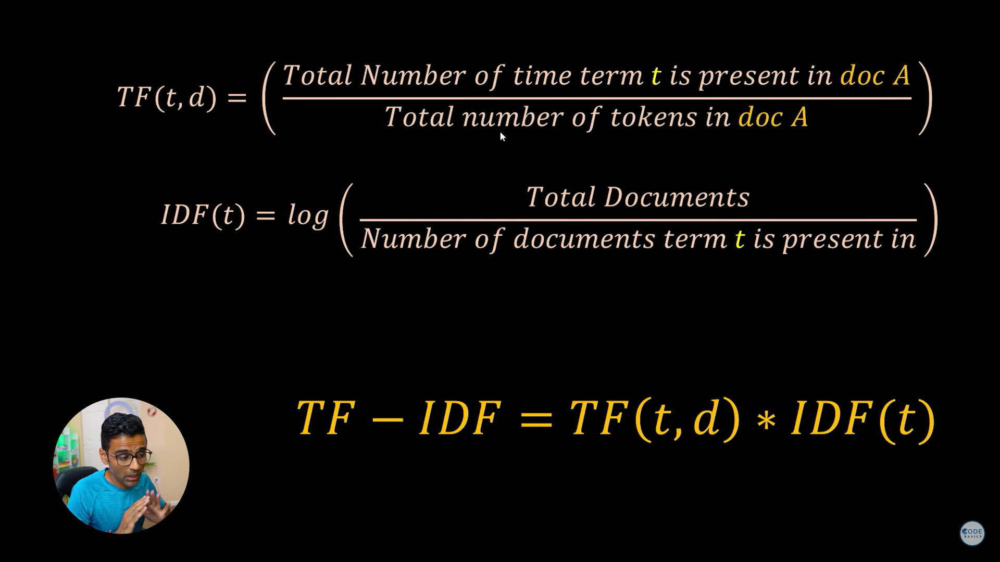
Document Frequency(DF) (Numerator)--> Total no. of documents (i.e article 1, article 2, article 3 and article 4 --> i.e 4)   

Document Frequency(DF) (Denominator)--> The occurance of a particular word in number of documents (for example, in the above picture, 'that' is repeated in article 1, article 2, and article 3. i.e DF of 'that' = 3)    

Term Frequency(TF) (Numerator) --> The no. of occurances of a particular word in single document (for example, in the above picture, 'that' is repeated 32 times in article 1).

Term Frequency(TF) (Denominator) --> Sum of all horizontal values of a particular document (for example, article 1)

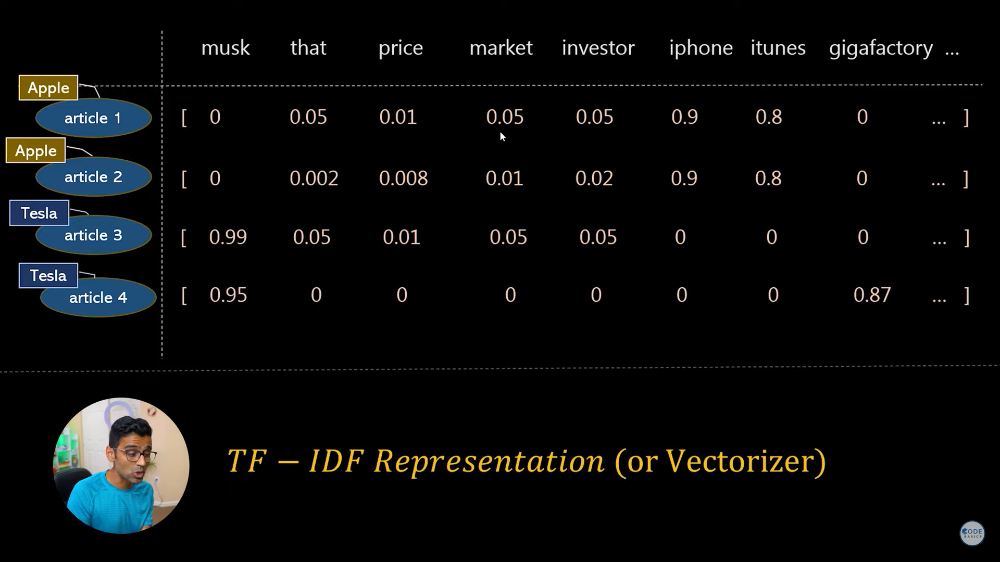

In sklearn library, 1 is added to the numerator and denominator and again 1 is added to the resultant value
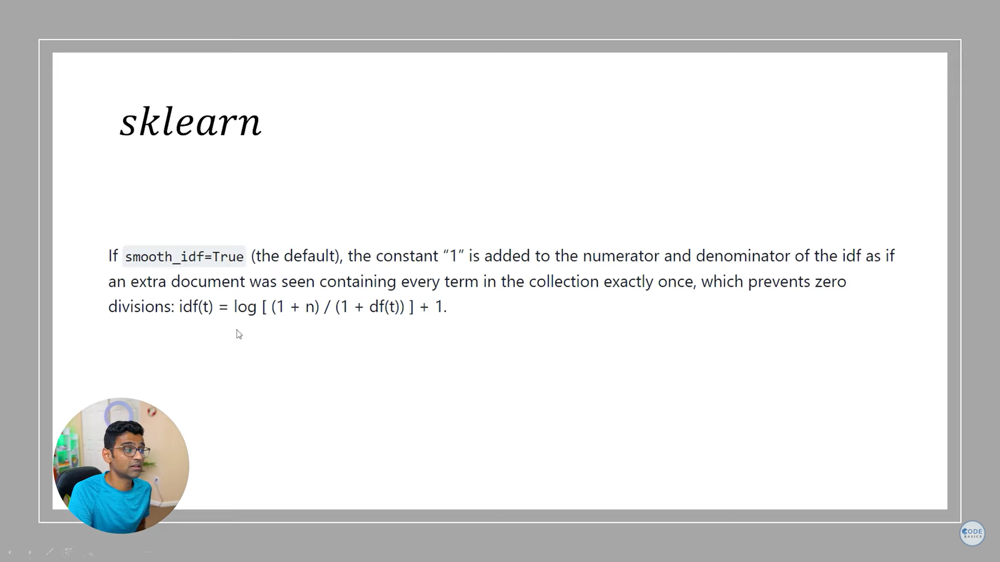

**Why is logged added to the formula?**
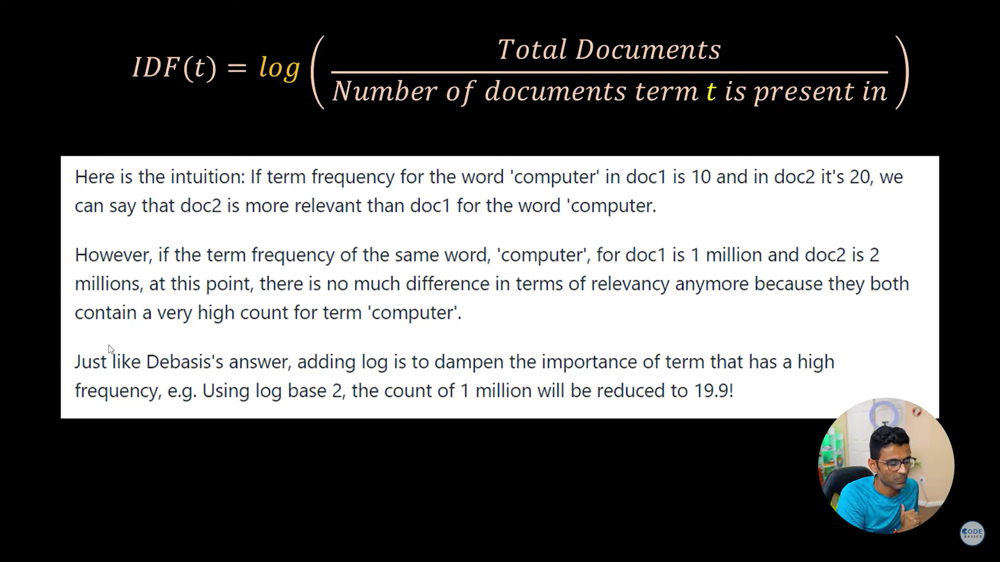

**Limitations**
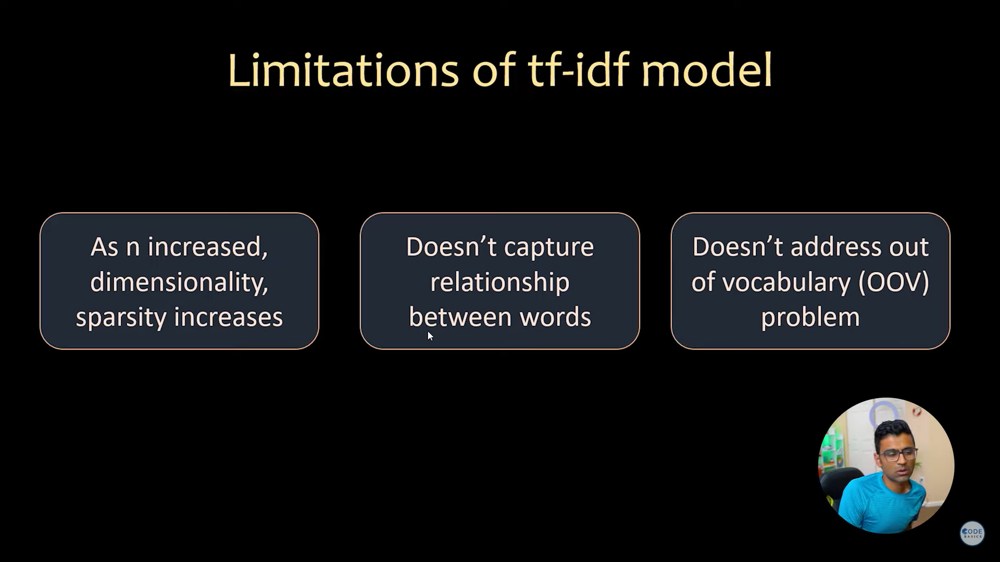

In [1]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [2]:
corpus = [
    "Thor eating pizza, Loki is eating pizza, Ironman ate pizza already",
    "Apple is announcing new iphone tomorrow",
    "Tesla is announcing new model-3 tomorrow",
    "Google is announcing new pixel-6 tomorrow",
    "Microsoft is announcing new surface tomorrow",
    "Amazon is announcing new eco-dot tomorrow",
    "I am eating biryani and you are eating grapes"
]

In [10]:
v = TfidfVectorizer()
vectorized = v.fit_transform(corpus)

In [11]:
print(v.vocabulary_)

{'thor': 25, 'eating': 10, 'pizza': 22, 'loki': 17, 'is': 16, 'ironman': 15, 'ate': 7, 'already': 0, 'apple': 5, 'announcing': 4, 'new': 20, 'iphone': 14, 'tomorrow': 26, 'tesla': 24, 'model': 19, 'google': 12, 'pixel': 21, 'microsoft': 18, 'surface': 23, 'amazon': 2, 'eco': 11, 'dot': 9, 'am': 1, 'biryani': 8, 'and': 3, 'you': 27, 'are': 6, 'grapes': 13}


In [12]:
all_feature_names = v.get_feature_names_out()
all_feature_names

array(['already', 'am', 'amazon', 'and', 'announcing', 'apple', 'are',
       'ate', 'biryani', 'dot', 'eating', 'eco', 'google', 'grapes',
       'iphone', 'ironman', 'is', 'loki', 'microsoft', 'model', 'new',
       'pixel', 'pizza', 'surface', 'tesla', 'thor', 'tomorrow', 'you'],
      dtype=object)

In [15]:
# getting tf-idf value for 'google'
index_of_google = list(all_feature_names).index('google') 
#since all_feature_names is numpy array, converting it into list to obtain index of particular element
v.idf_[index_of_google]

2.386294361119891

In [20]:
# for index,feature in enumerate(all_feature_names):
print(f"{feature} : {v.idf_[index]}")

you : 2.386294361119891


In [17]:
#let's print the transformed output from tf-idf
print(vectorized.toarray())

[[0.24266547 0.         0.         0.         0.         0.
  0.         0.24266547 0.         0.         0.40286636 0.
  0.         0.         0.         0.24266547 0.11527033 0.24266547
  0.         0.         0.         0.         0.72799642 0.
  0.         0.24266547 0.         0.        ]
 [0.         0.         0.         0.         0.30652086 0.5680354
  0.         0.         0.         0.         0.         0.
  0.         0.         0.5680354  0.         0.26982671 0.
  0.         0.         0.30652086 0.         0.         0.
  0.         0.         0.30652086 0.        ]
 [0.         0.         0.         0.         0.30652086 0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.26982671 0.
  0.         0.5680354  0.30652086 0.         0.         0.
  0.5680354  0.         0.30652086 0.        ]
 [0.         0.         0.         0.         0.30652086 0.
  0.         0.         0.         0.         0.         0.
  0.

In [18]:
print(vectorized.toarray().shape)

(7, 28)


7 --> total no.of sentences taken      
28 --> size of the vocabulary

# E-commerce product classification

In [21]:
import pandas as pd
import numpy as np

In [22]:
data = pd.read_csv("D:\programming languages\datasets\Ecommerce_data.csv")
data

,Text,label
0,Urban Ladder Eisner Low Back Study-Office Comp...,Household
1,"Contrast living Wooden Decorative Box,Painted ...",Household
2,IO Crest SY-PCI40010 PCI RAID Host Controller ...,Electronics
3,ISAKAA Baby Socks from Just Born to 8 Years- P...,Clothing & Accessories
4,Indira Designer Women's Art Mysore Silk Saree ...,Clothing & Accessories
...,...,...
23995,Marvel Physics MCQ's for MHT - CET,Books
23996,Internet Download Manager | Lifetime License |...,Books
23997,Sadhubela's Handcrafted Iron Degchi Handi Pot ...,Household
23998,Audio-Technica AT-LP60 Automatic Belt Driven D...,Electronics


In [23]:
data.label.value_counts()

Household                 6000
Electronics               6000
Books                     6000
Clothing & Accessories    6000
Name: label, dtype: int64

In [24]:
categories = {
    'Household':0,
    'Electronics':1,
    'Books':2,
    'Clothing & Accessories':3
}

In [25]:
data['label_num'] = data['label'].map(categories)
data

,Text,label,label_num
0,Urban Ladder Eisner Low Back Study-Office Comp...,Household,0
1,"Contrast living Wooden Decorative Box,Painted ...",Household,0
2,IO Crest SY-PCI40010 PCI RAID Host Controller ...,Electronics,1
3,ISAKAA Baby Socks from Just Born to 8 Years- P...,Clothing & Accessories,3
4,Indira Designer Women's Art Mysore Silk Saree ...,Clothing & Accessories,3
...,...,...,...
23995,Marvel Physics MCQ's for MHT - CET,Books,2
23996,Internet Download Manager | Lifetime License |...,Books,2
23997,Sadhubela's Handcrafted Iron Degchi Handi Pot ...,Household,0
23998,Audio-Technica AT-LP60 Automatic Belt Driven D...,Electronics,1


In [27]:
x = data.Text
y = data.label_num

In [26]:
from sklearn.model_selection import train_test_split

In [28]:
# splitting the data
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.2, random_state = 3, stratify = y)

In [34]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.pipeline import Pipeline
from sklearn.metrics import classification_report
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import MultinomialNB

In [31]:
# using K-nearest neighbors
clf = Pipeline([
     ('vectorizer_tfidf',TfidfVectorizer()),    
     ('KNN', KNeighborsClassifier())         
])

#2. fit with X_train and y_train
clf.fit(x_train, y_train)


#3. get the predictions for X_test and store it in y_pred
y_pred = clf.predict(x_test)


#4. print the classfication report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.94      0.96      0.95      1200
           1       0.96      0.97      0.97      1200
           2       0.97      0.95      0.96      1200
           3       0.98      0.97      0.97      1200

    accuracy                           0.96      4800
   macro avg       0.96      0.96      0.96      4800
weighted avg       0.96      0.96      0.96      4800



In [35]:
# using Multinomial Naive Bayes
clf = Pipeline([
     ('vectorizer_tfidf',TfidfVectorizer()),    
     ('Multi NB', MultinomialNB())         
])

#2. fit with X_train and y_train
clf.fit(x_train, y_train)


#3. get the predictions for X_test and store it in y_pred
y_pred = clf.predict(x_test)


#4. print the classfication report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.92      0.97      0.94      1200
           1       0.97      0.97      0.97      1200
           2       0.98      0.92      0.95      1200
           3       0.98      0.98      0.98      1200

    accuracy                           0.96      4800
   macro avg       0.96      0.96      0.96      4800
weighted avg       0.96      0.96      0.96      4800



In [36]:
# using Random Forest
clf = Pipeline([
     ('vectorizer_tfidf',TfidfVectorizer()),        #using the ngram_range parameter 
     ('Random Forest', RandomForestClassifier())         
])

#2. fit with X_train and y_train
clf.fit(x_train, y_train)


#3. get the predictions for X_test and store it in y_pred
y_pred = clf.predict(x_test)


#4. print the classfication report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.96      0.96      0.96      1200
           1       0.98      0.97      0.98      1200
           2       0.98      0.98      0.98      1200
           3       0.98      0.99      0.98      1200

    accuracy                           0.98      4800
   macro avg       0.98      0.98      0.98      4800
weighted avg       0.98      0.98      0.98      4800



Here, we can observe that Random Forest is performing better.

**Use text pre-processing to remove stop words, punctuations and apply lemmatization**

In [37]:
import warnings
warnings.filterwarnings('ignore')

In [38]:
import spacy

# load english language model and create nlp object from it
nlp = spacy.load("en_core_web_sm") 

def preprocess(text):
    # remove stop words and lemmatize the text
    doc = nlp(text)
    filtered_tokens = []
    for token in doc:
        if token.is_stop or token.is_punct:
            continue
        filtered_tokens.append(token.lemma_)
    
    return " ".join(filtered_tokens) 

In [39]:
# applying preprocessing
data['preprocessed_txt'] = data['Text'].apply(preprocess)

In [40]:
X_train, X_test, y_train, y_test = train_test_split(
    data.preprocessed_txt, 
    data.label_num,
    test_size=0.2, # 20% samples will go to test dataset
    random_state=2022,
    stratify=data.label_num
)

In [41]:
clf = Pipeline([
     ('vectorizer_tfidf',TfidfVectorizer()),        #using the ngram_range parameter 
     ('Random Forest', RandomForestClassifier())         
])

#2. fit with X_train and y_train
clf.fit(X_train, y_train)


#3. get the predictions for X_test and store it in y_pred
y_pred = clf.predict(X_test)


#4. print the classfication report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.96      0.96      0.96      1200
           1       0.98      0.98      0.98      1200
           2       0.98      0.97      0.98      1200
           3       0.98      0.99      0.98      1200

    accuracy                           0.97      4800
   macro avg       0.97      0.97      0.97      4800
weighted avg       0.97      0.97      0.97      4800



**Plot Confusion Matrix**

In [42]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, y_pred)
cm

array([[1157,   14,   13,   16],
       [  20, 1171,    5,    4],
       [  17,    9, 1165,    9],
       [   8,    0,    6, 1186]], dtype=int64)

Text(69.0, 0.5, 'Truth')

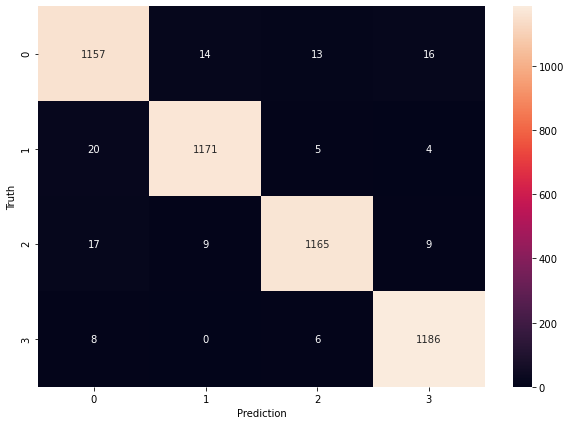

In [43]:
from matplotlib import pyplot as plt
import seaborn as sn
plt.figure(figsize = (10,7))
sn.heatmap(cm, annot=True, fmt='d')
plt.xlabel('Prediction')
plt.ylabel('Truth')

# Exercise

**Emotions classification**

In [1]:
import pandas as pd
import numpy as np

In [2]:
data = pd.read_csv("D:\programming languages\datasets\Emotions_classification_dataset.csv")
data

,Comment,Emotion
0,i seriously hate one subject to death but now ...,fear
1,im so full of life i feel appalled,anger
2,i sit here to write i start to dig out my feel...,fear
3,ive been really angry with r and i feel like a...,joy
4,i feel suspicious if there is no one outside l...,fear
...,...,...
5932,i begun to feel distressed for you,fear
5933,i left feeling annoyed and angry thinking that...,anger
5934,i were to ever get married i d have everything...,joy
5935,i feel reluctant in applying there because i w...,fear


In [3]:
data.Emotion.value_counts()

joy      2000
anger    2000
fear     1937
Name: Emotion, dtype: int64

In [4]:
import warnings
warnings.filterwarnings('ignore')

In [5]:
import spacy
nlp = spacy.load('en_core_web_sm')

In [6]:
def preprocess(text):
    preprocessed_text = []
    doc = nlp(text)
    for token in doc:
        if not token.is_stop and not token.is_punct:
            preprocessed_text.append(token.lemma_)
    return " ".join(preprocessed_text)

In [7]:
data['preprocessed_text'] = data['Comment'].apply(preprocess)

In [8]:
data

,Comment,Emotion,preprocessed_text
0,i seriously hate one subject to death but now ...,fear,seriously hate subject death feel reluctant drop
1,im so full of life i feel appalled,anger,m life feel appalled
2,i sit here to write i start to dig out my feel...,fear,sit write start dig feeling think afraid accep...
3,ive been really angry with r and i feel like a...,joy,ve angry r feel like idiot trust place
4,i feel suspicious if there is no one outside l...,fear,feel suspicious outside like rapture happen
...,...,...,...
5932,i begun to feel distressed for you,fear,begin feel distressed
5933,i left feeling annoyed and angry thinking that...,anger,leave feel annoyed angry thinking center stupi...
5934,i were to ever get married i d have everything...,joy,marry d ready offer ve get club perfect good l...
5935,i feel reluctant in applying there because i w...,fear,feel reluctant apply want able find company kn...


In [9]:
categories = {
    'joy':0,
    'anger':1,
    'fear':2
}

In [10]:
data['label_num'] = data['Emotion'].map(categories)
data

,Comment,Emotion,preprocessed_text,label_num
0,i seriously hate one subject to death but now ...,fear,seriously hate subject death feel reluctant drop,2
1,im so full of life i feel appalled,anger,m life feel appalled,1
2,i sit here to write i start to dig out my feel...,fear,sit write start dig feeling think afraid accep...,2
3,ive been really angry with r and i feel like a...,joy,ve angry r feel like idiot trust place,0
4,i feel suspicious if there is no one outside l...,fear,feel suspicious outside like rapture happen,2
...,...,...,...,...
5932,i begun to feel distressed for you,fear,begin feel distressed,2
5933,i left feeling annoyed and angry thinking that...,anger,leave feel annoyed angry thinking center stupi...,1
5934,i were to ever get married i d have everything...,joy,marry d ready offer ve get club perfect good l...,0
5935,i feel reluctant in applying there because i w...,fear,feel reluctant apply want able find company kn...,2


In [11]:
x = data.preprocessed_text
y = data.label_num

In [12]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.2, random_state = 3, stratify = y)

In [15]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.pipeline import Pipeline
from sklearn.metrics import classification_report
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.feature_extraction.text import TfidfVectorizer

In [16]:
# using K-nearest neighbors
clf = Pipeline([
     ('vectorizer_tfidf',TfidfVectorizer()),    
     ('KNN', KNeighborsClassifier())         
])

#2. fit with X_train and y_train
clf.fit(x_train, y_train)


#3. get the predictions for X_test and store it in y_pred
y_pred = clf.predict(x_test)


#4. print the classfication report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.81      0.83      0.82       400
           1       0.83      0.86      0.84       400
           2       0.85      0.79      0.82       388

    accuracy                           0.83      1188
   macro avg       0.83      0.83      0.83      1188
weighted avg       0.83      0.83      0.83      1188



In [17]:
# using Multinomial Naive Bayes
clf = Pipeline([
     ('vectorizer_tfidf',TfidfVectorizer()),    
     ('Multi NB', MultinomialNB())         
])

#2. fit with X_train and y_train
clf.fit(x_train, y_train)


#3. get the predictions for X_test and store it in y_pred
y_pred = clf.predict(x_test)


#4. print the classfication report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.94      0.91      0.93       400
           1       0.91      0.92      0.91       400
           2       0.90      0.92      0.91       388

    accuracy                           0.92      1188
   macro avg       0.92      0.92      0.92      1188
weighted avg       0.92      0.92      0.92      1188



In [48]:
# using Random Forest
clf = Pipeline([
     ('vectorizer_tfidf',TfidfVectorizer()),       
     ('Random Forest', RandomForestClassifier())         
])

#2. fit with X_train and y_train
clf.fit(x_train, y_train)


#3. get the predictions for X_test and store it in y_pred
y_pred = clf.predict(x_test)


#4. print the classfication report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.94      0.95      0.95       400
           1       0.93      0.91      0.92       400
           2       0.93      0.94      0.93       388

    accuracy                           0.93      1188
   macro avg       0.93      0.93      0.93      1188
weighted avg       0.93      0.93      0.93      1188



In [68]:
# Testing the model
texts = [
    "I didn't write the home work. I think my teacher will beat me. I am afraid of that.",
    "I got big suprise for my birthday. I am very happy.",
    "My GF cheated on me. I am very angry."
]
text = np.array(texts)
text

array(["I didn't write the home work. I think my teacher will beat me. I am afraid of that.",
       'I got big suprise for my birthday. I am very happy.',
       'My GF cheated on me. I am very angry.'], dtype='<U83')

In [69]:
predictions = clf.predict(texts)
predictions

array([2, 0, 1], dtype=int64)

In [70]:
categories

{'joy': 0, 'anger': 1, 'fear': 2}

# Word Embeddings

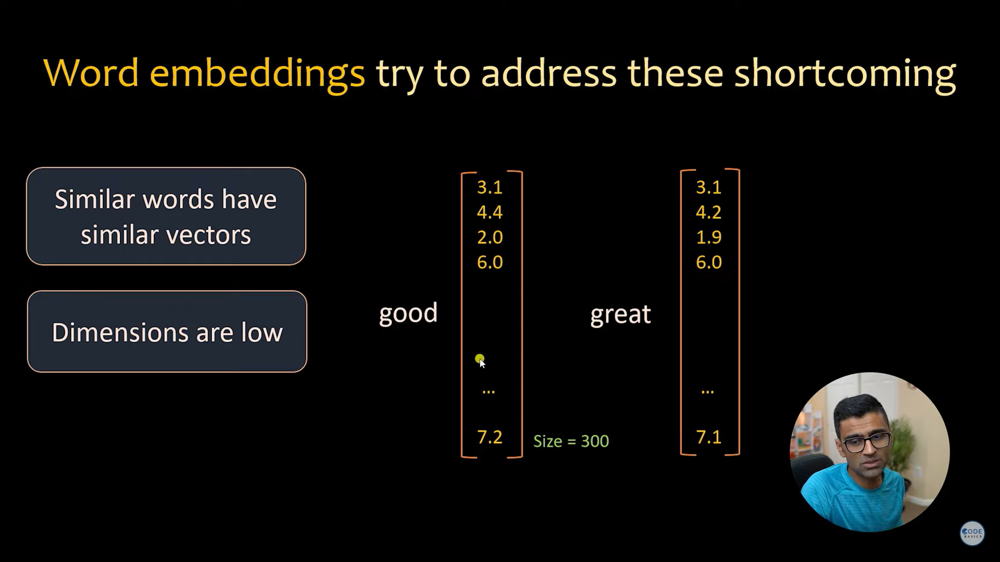

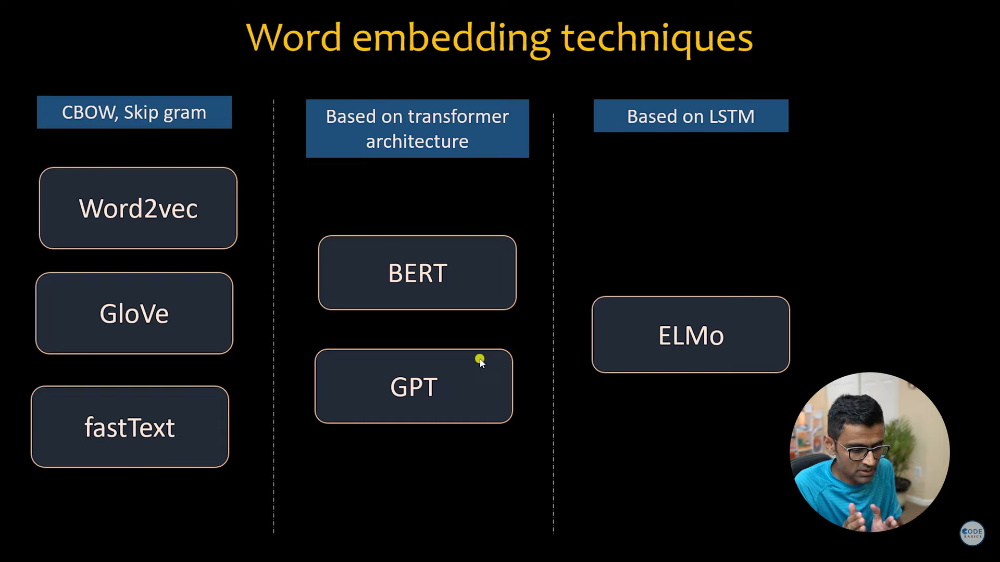

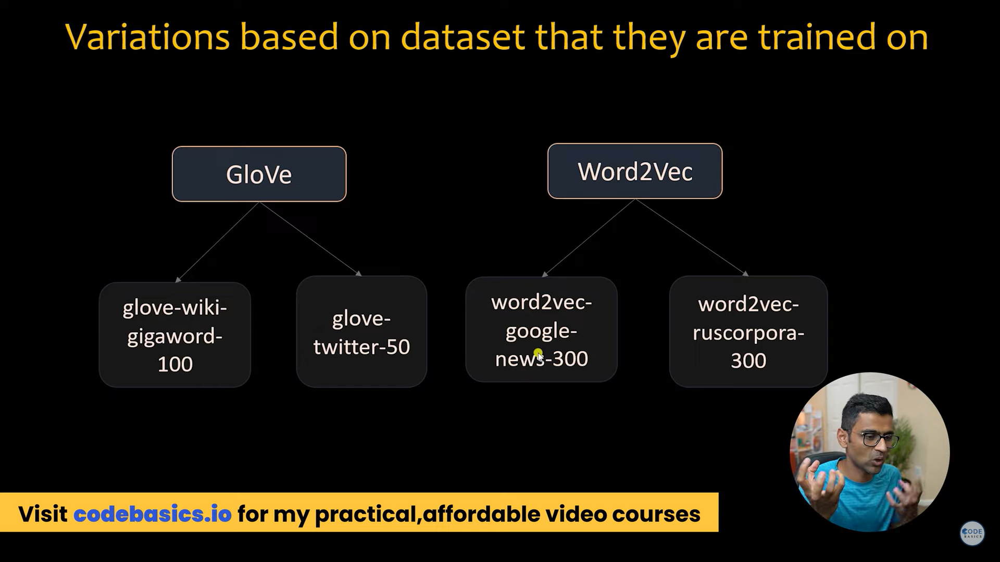

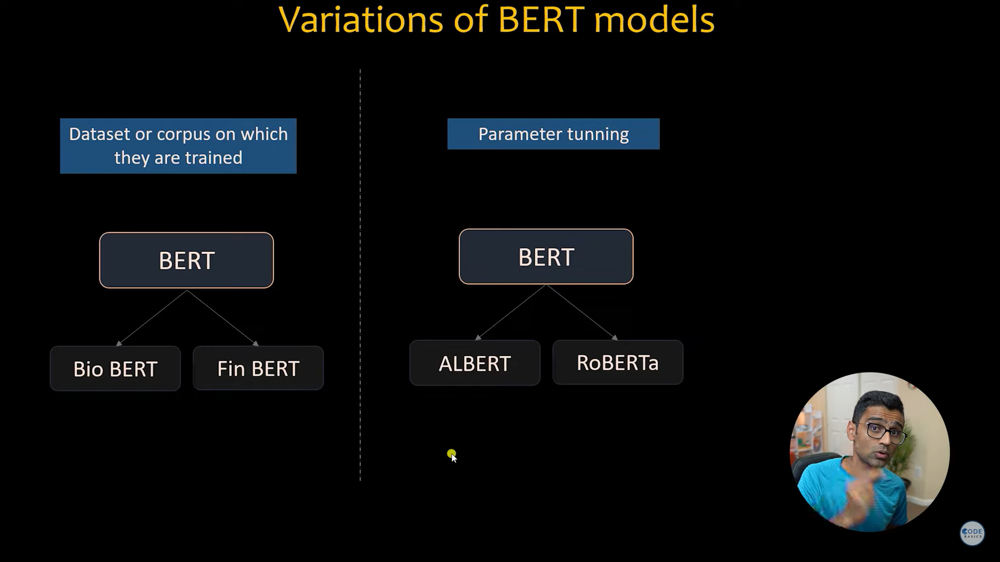

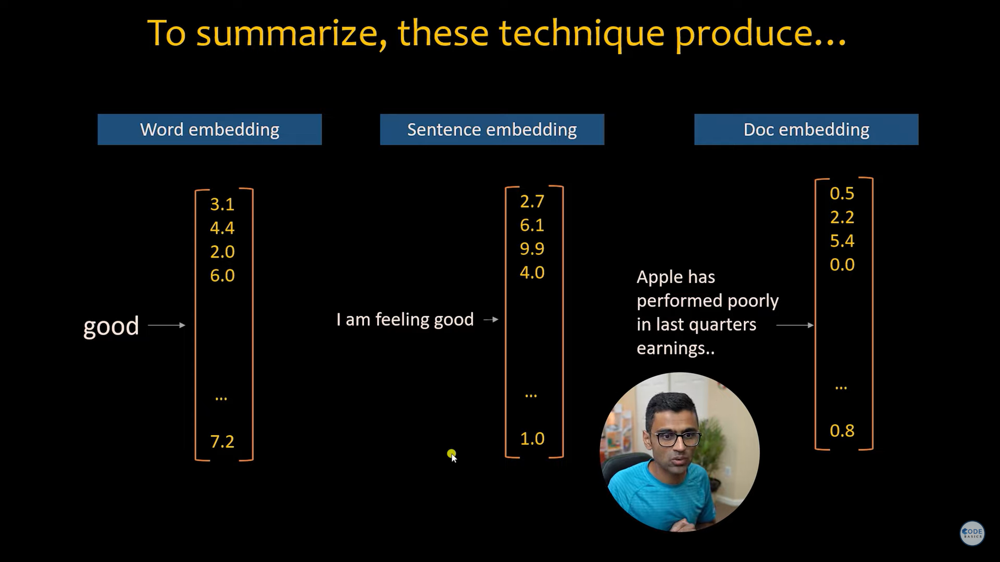

# Word vectors in spacy

In order to perform word embeddings in spacy, either medium(en_core_web_md) or large(en_core_web_lg) models has to be used.    
The difference between small,medium and large models can be checked at - https://spacy.io/models/en

**en_core_web_sm**
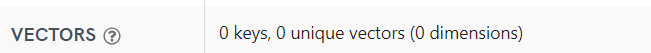

**en_core_web_md**
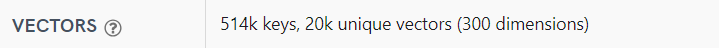

**en_core_web_lg**
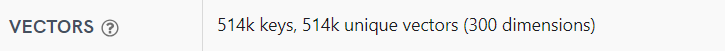

In [2]:
#!python -m spacy download en_core_web_lg

2023-08-29 20:58:47.606426: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'cudart64_110.dll'; dlerror: cudart64_110.dll not found
2023-08-29 20:58:47.607256: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
2023-08-29 20:59:48.546673: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'nvcuda.dll'; dlerror: nvcuda.dll not found
2023-08-29 20:59:48.548273: W tensorflow/stream_executor/cuda/cuda_driver.cc:263] failed call to cuInit: UNKNOWN ERROR (303)
2023-08-29 20:59:48.577065: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:169] retrieving CUDA diagnostic information for host: LAPTOP-5P5E5DKR
2023-08-29 20:59:48.577506: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:176] hostname: LAPTOP-5P5E5DKR


[+] Download and installation successful
You can now load the package via spacy.load('en_core_web_lg')


In [3]:
import spacy

In [4]:
nlp = spacy.load("en_core_web_lg")

In [8]:
doc = nlp("dog cat banana alfdsl")
for token in doc:
    print(f"{token} | Has Token? : {token.has_vector} | OOV? : {token.is_oov}")

dog | Has Token? : True | OOV? : False
cat | Has Token? : True | OOV? : False
banana | Has Token? : True | OOV? : False
alfdsl | Has Token? : False | OOV? : True


Here we can observe that this model has no vectors for non English words.

In [9]:
# getting the vector for 'dog'
doc[0].vector

array([ 1.2330e+00,  4.2963e+00, -7.9738e+00, -1.0121e+01,  1.8207e+00,
        1.4098e+00, -4.5180e+00, -5.2261e+00, -2.9157e-01,  9.5234e-01,
        6.9880e+00,  5.0637e+00, -5.5726e-03,  3.3395e+00,  6.4596e+00,
       -6.3742e+00,  3.9045e-02, -3.9855e+00,  1.2085e+00, -1.3186e+00,
       -4.8886e+00,  3.7066e+00, -2.8281e+00, -3.5447e+00,  7.6888e-01,
        1.5016e+00, -4.3632e+00,  8.6480e+00, -5.9286e+00, -1.3055e+00,
        8.3870e-01,  9.0137e-01, -1.7843e+00, -1.0148e+00,  2.7300e+00,
       -6.9039e+00,  8.0413e-01,  7.4880e+00,  6.1078e+00, -4.2130e+00,
       -1.5384e-01, -5.4995e+00,  1.0896e+01,  3.9278e+00, -1.3601e-01,
        7.7732e-02,  3.2218e+00, -5.8777e+00,  6.1359e-01, -2.4287e+00,
        6.2820e+00,  1.3461e+01,  4.3236e+00,  2.4266e+00, -2.6512e+00,
        1.1577e+00,  5.0848e+00, -1.7058e+00,  3.3824e+00,  3.2850e+00,
        1.0969e+00, -8.3711e+00, -1.5554e+00,  2.0296e+00, -2.6796e+00,
       -6.9195e+00, -2.3386e+00, -1.9916e+00, -3.0450e+00,  2.48

In [18]:
# getting the sentence vector
# sentence vector is the average of all the word vectors
doc = nlp("dog cat banana alfdsl")
doc.vector

array([ 1.285995  ,  1.51985   , -3.1519876 , -4.857275  ,  0.40372053,
       -0.702725  , -1.97505   , -1.9329001 , -0.79143   ,  0.99263746,
        3.560485  ,  1.390425  ,  0.26564184,  2.01145   ,  3.3977425 ,
       -3.612475  , -0.15815374, -2.1185076 ,  1.435475  , -1.710825  ,
       -2.4027236 ,  2.909375  , -2.1509075 , -2.2286    , -0.668355  ,
       -0.9713    , -2.6473498 ,  3.782715  , -2.5905025 , -0.33405   ,
       -0.61644995, -0.599235  , -1.24345   , -0.14730498,  0.490825  ,
       -4.184225  ,  1.0886575 ,  1.9182426 ,  2.1102002 , -2.239075  ,
       -0.19210999, -2.6021075 ,  5.2194247 ,  2.7733    ,  1.3173975 ,
        0.5136955 ,  1.3593975 , -1.86975   , -0.20521674, -1.4796726 ,
        2.3111901 ,  5.665     ,  2.3114748 ,  0.7079749 , -0.90067494,
        1.17948   ,  2.5487623 ,  0.68675   ,  1.7658175 ,  1.3378    ,
        0.59345746, -3.6535451 ,  0.527775  ,  1.3896024 , -2.6922002 ,
       -3.325725  , -1.3890749 , -0.874045  ,  0.09935001,  0.87

In [10]:
doc[0].vector.shape # as we saw earlier, the length of a vector is 300

(300,)

In [11]:
# checking the similarity between the words
base_token = nlp("bread")

doc = nlp("bread sandwich burger car tiger human wheat")
for token in doc:
    print(f"{token} <-> {base_token} | Similarity : {token.similarity(base_token)}")

bread <-> bread | Similarity : 0.9999999744752309
sandwich <-> bread | Similarity : 0.634106782477101
burger <-> bread | Similarity : 0.4752069113758708
car <-> bread | Similarity : 0.06451533308853552
tiger <-> bread | Similarity : 0.04764611675903374
human <-> bread | Similarity : 0.2151154210812192
wheat <-> bread | Similarity : 0.6150360888607199


In [14]:
# function that checks the similarity 
def check_similarity(base_word, words_to_compare):
    base_token = nlp(base_word)
    doc = nlp(words_to_compare)
    for token in doc:
        print(f"{token} <-> {base_token} | Similarity : {token.similarity(base_token)}")

In [15]:
check_similarity("iphone", "apple samsung iphone dog kitten")

apple <-> iphone | Similarity : 0.4387907748060368
samsung <-> iphone | Similarity : 0.670859081425417
iphone <-> iphone | Similarity : 0.9999999983096304
dog <-> iphone | Similarity : 0.08211864228011527
kitten <-> iphone | Similarity : 0.10222318459666081


In [19]:
# performing arithmetic operations on words
king = nlp.vocab['king'].vector
man = nlp.vocab['man'].vector
woman = nlp.vocab['woman'].vector
result = king - man + woman
queen = nlp.vocab['queen'].vector

In [22]:
# checking the cosine similarity between 'queen' and 'result'
from sklearn.metrics.pairwise import cosine_similarity
similarity = cosine_similarity([queen], [result])
print("Similartity :",similarity)

Similartity : [[0.6178014]]


# News classification using spacy word vectors

In [23]:
import pandas as pd
import numpy as np

In [24]:
data = pd.read_csv("D:\programming languages\datasets\Fake_and_real_news_dataset.csv")
data

,Unnamed: 0,title,text,subject,date,label
0,0,Donald Trump Sends Out Embarrassing New Year’...,Donald Trump just couldn t wish all Americans ...,News,"December 31, 2017",Fake
1,1,Drunk Bragging Trump Staffer Started Russian ...,House Intelligence Committee Chairman Devin Nu...,News,"December 31, 2017",Fake
2,2,Sheriff David Clarke Becomes An Internet Joke...,"On Friday, it was revealed that former Milwauk...",News,"December 30, 2017",Fake
3,3,Trump Is So Obsessed He Even Has Obama’s Name...,"On Christmas day, Donald Trump announced that ...",News,"December 29, 2017",Fake
4,4,Pope Francis Just Called Out Donald Trump Dur...,Pope Francis used his annual Christmas Day mes...,News,"December 25, 2017",Fake
...,...,...,...,...,...,...
44893,21412,'Fully committed' NATO backs new U.S. approach...,BRUSSELS (Reuters) - NATO allies on Tuesday we...,worldnews,"August 22, 2017",Real
44894,21413,LexisNexis withdrew two products from Chinese ...,"LONDON (Reuters) - LexisNexis, a provider of l...",worldnews,"August 22, 2017",Real
44895,21414,Minsk cultural hub becomes haven from authorities,MINSK (Reuters) - In the shadow of disused Sov...,worldnews,"August 22, 2017",Real
44896,21415,Vatican upbeat on possibility of Pope Francis ...,MOSCOW (Reuters) - Vatican Secretary of State ...,worldnews,"August 22, 2017",Real


In [28]:
# function that returns that sub dataframe for the sake of simplicity
def get_sub_dataset(df,label_column, samples_per_class = 300):
    sub_df = pd.DataFrame()
    for class_label in np.unique(df[label_column]):
        temp = df[df[label_column] == class_label].sample(samples_per_class)
        sub_df = pd.concat([sub_df,temp],axis = 0)
    return sub_df

In [29]:
sub_df = get_sub_dataset(data, 'label')
sub_df

,Unnamed: 0,title,text,subject,date,label
12290,12290,“PARTISAN DEMOCRAT” Will Oversee WI Presidenti...,The Wisconsin Elections Commission announced F...,politics,"Nov 26, 2016",Fake
5040,5040,WATCH: Giuliani’s BIG LIE At Trump Rally Is J...,Former New York City mayor Rudy Giuliani has b...,News,"August 15, 2016",Fake
1840,1840,Women In The World Founder Has The PERFECT De...,This past week was the annual Women in the Wor...,News,"April 9, 2017",Fake
6882,6882,National Republican Just Blamed Women For Ass...,Republican presidential candidate and current ...,News,"April 15, 2016",Fake
12994,12994,MICHELLE OBAMA TO HILLARY: “If You Can’t Run Y...,Remember when Mooch thought having #CrookedHil...,politics,"Sep 16, 2016",Fake
...,...,...,...,...,...,...
44216,20735,Merkel call to stop Turkey's EU bid draws mixe...,TALLINN/PARIS (Reuters) - German Chancellor An...,worldnews,"September 7, 2017",Real
35867,12386,Fatal crash closes Swiss Gotthard road tunnel ...,ZURICH (Reuters) - The Gotthard road tunnel un...,worldnews,"December 13, 2017",Real
23972,491,Factbox: Republican senators to watch in tax b...,(Reuters) - U.S. Republicans made progress on ...,politicsNews,"November 28, 2017",Real
37203,13722,China sentences Taiwanese activist to five yea...,BEIJING/TAIPEI (Reuters) - China on Tuesday se...,worldnews,"November 28, 2017",Real


In [31]:
sub_df.label.value_counts()

Real    300
Fake    300
Name: label, dtype: int64

In [33]:
sub_df['label_num'] = sub_df['label'].apply(lambda x : 1 if x == 'Fake' else 0)
sub_df

,Unnamed: 0,title,text,subject,date,label,label_num
12290,12290,“PARTISAN DEMOCRAT” Will Oversee WI Presidenti...,The Wisconsin Elections Commission announced F...,politics,"Nov 26, 2016",Fake,1
5040,5040,WATCH: Giuliani’s BIG LIE At Trump Rally Is J...,Former New York City mayor Rudy Giuliani has b...,News,"August 15, 2016",Fake,1
1840,1840,Women In The World Founder Has The PERFECT De...,This past week was the annual Women in the Wor...,News,"April 9, 2017",Fake,1
6882,6882,National Republican Just Blamed Women For Ass...,Republican presidential candidate and current ...,News,"April 15, 2016",Fake,1
12994,12994,MICHELLE OBAMA TO HILLARY: “If You Can’t Run Y...,Remember when Mooch thought having #CrookedHil...,politics,"Sep 16, 2016",Fake,1
...,...,...,...,...,...,...,...
44216,20735,Merkel call to stop Turkey's EU bid draws mixe...,TALLINN/PARIS (Reuters) - German Chancellor An...,worldnews,"September 7, 2017",Real,0
35867,12386,Fatal crash closes Swiss Gotthard road tunnel ...,ZURICH (Reuters) - The Gotthard road tunnel un...,worldnews,"December 13, 2017",Real,0
23972,491,Factbox: Republican senators to watch in tax b...,(Reuters) - U.S. Republicans made progress on ...,politicsNews,"November 28, 2017",Real,0
37203,13722,China sentences Taiwanese activist to five yea...,BEIJING/TAIPEI (Reuters) - China on Tuesday se...,worldnews,"November 28, 2017",Real,0


In [34]:
import spacy
nlp = spacy.load('en_core_web_lg')

In [35]:
# generating word vectors for text
sub_df['word_vectors'] = sub_df['text'].apply(lambda x : nlp(x).vector)

In [36]:
sub_df

,Unnamed: 0,title,text,subject,date,label,label_num,word_vectors
12290,12290,“PARTISAN DEMOCRAT” Will Oversee WI Presidenti...,The Wisconsin Elections Commission announced F...,politics,"Nov 26, 2016",Fake,1,"[-2.3810642, 0.29690728, -1.7409241, 0.5326297..."
5040,5040,WATCH: Giuliani’s BIG LIE At Trump Rally Is J...,Former New York City mayor Rudy Giuliani has b...,News,"August 15, 2016",Fake,1,"[-2.5142553, 0.25607586, -2.0416613, 1.335851,..."
1840,1840,Women In The World Founder Has The PERFECT De...,This past week was the annual Women in the Wor...,News,"April 9, 2017",Fake,1,"[-1.2057179, 1.0788397, -2.2609017, -0.2444887..."
6882,6882,National Republican Just Blamed Women For Ass...,Republican presidential candidate and current ...,News,"April 15, 2016",Fake,1,"[-2.2724826, 0.6623826, -2.7510116, 0.43702617..."
12994,12994,MICHELLE OBAMA TO HILLARY: “If You Can’t Run Y...,Remember when Mooch thought having #CrookedHil...,politics,"Sep 16, 2016",Fake,1,"[-0.86487585, 1.9975816, -3.193424, -0.5496136..."
...,...,...,...,...,...,...,...,...
44216,20735,Merkel call to stop Turkey's EU bid draws mixe...,TALLINN/PARIS (Reuters) - German Chancellor An...,worldnews,"September 7, 2017",Real,0,"[-1.8463402, 0.8529878, -1.3657583, 0.17659216..."
35867,12386,Fatal crash closes Swiss Gotthard road tunnel ...,ZURICH (Reuters) - The Gotthard road tunnel un...,worldnews,"December 13, 2017",Real,0,"[-3.2914722, -0.32971117, -1.092744, 1.5438415..."
23972,491,Factbox: Republican senators to watch in tax b...,(Reuters) - U.S. Republicans made progress on ...,politicsNews,"November 28, 2017",Real,0,"[-1.8926597, 1.090231, -2.223026, 0.5414957, 4..."
37203,13722,China sentences Taiwanese activist to five yea...,BEIJING/TAIPEI (Reuters) - China on Tuesday se...,worldnews,"November 28, 2017",Real,0,"[-2.4216678, 0.7012624, -1.8039993, 0.29262453..."


In [39]:
x = sub_df.word_vectors.values
y = sub_df.label_num

In [37]:
# splitting the data into training and testing
from sklearn.model_selection import train_test_split

In [40]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.2, random_state = 3, stratify = y)

In [43]:
x_train

array([array([-2.43681359e+00,  5.16048670e-01, -3.09188557e+00,  4.84727114e-01,
               4.33911657e+00,  1.68081433e-01,  9.85182047e-01,  4.57082939e+00,
              -2.23455966e-01, -1.25297213e+00,  5.67447948e+00,  1.38887978e+00,
              -3.84183812e+00,  1.28111279e+00, -5.14325276e-02,  2.26224780e+00,
               1.70506036e+00, -3.25622052e-01, -1.17076695e+00, -2.11151528e+00,
               4.92745191e-01, -6.37718856e-01, -1.01349497e+00,  2.30812743e-01,
               3.41280788e-01, -1.61301231e+00, -1.69237018e+00, -1.67358434e+00,
              -7.26138651e-01,  1.03538656e+00,  1.28740406e+00,  6.25588775e-01,
              -1.03250659e+00, -2.71430922e+00, -1.43147862e+00, -6.50501907e-01,
               4.32649821e-01,  9.00915802e-01,  1.91515172e+00,  1.33011401e+00,
              -2.22998992e-01, -2.14750916e-01,  6.04549162e-02,  5.88759661e-01,
              -2.35114574e+00,  1.75636184e+00,  1.39431274e+00, -2.14296937e+00,
              -5

Here, we can observe that, there is an array inside an array and is not in the proper 2D array format. Hence tackling this problem using 'stack' function in numpy.

In [44]:
x_train_2d = np.stack(x_train)
x_train_2d

array([[-2.4368136 ,  0.51604867, -3.0918856 , ..., -0.9758257 ,
        -2.2408235 ,  1.0260803 ],
       [-1.8683206 ,  0.41161698, -1.520487  , ..., -0.6892677 ,
        -2.1492739 ,  0.3807824 ],
       [-2.159836  ,  0.5642099 , -2.2446446 , ..., -1.3880776 ,
        -1.7544725 ,  0.8484053 ],
       ...,
       [-3.2914722 , -0.32971117, -1.092744  , ..., -2.012147  ,
        -0.4130269 ,  0.10193634],
       [-1.8117111 ,  0.84096503, -1.7182723 , ...,  0.33506763,
        -2.199773  ,  1.7589804 ],
       [-2.3211184 ,  0.41887054, -2.4299424 , ..., -0.90168136,
        -1.9082935 ,  0.71112293]], dtype=float32)

In [45]:
x_test_2d = np.stack(x_test)

In [47]:
# Scaling the values
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
x_train_scaled = scaler.fit_transform(x_train_2d)
x_test_scaled = scaler.transform(x_test_2d)

Here the values are scaled just because to handle negative values and if not scaled, below error is raised.
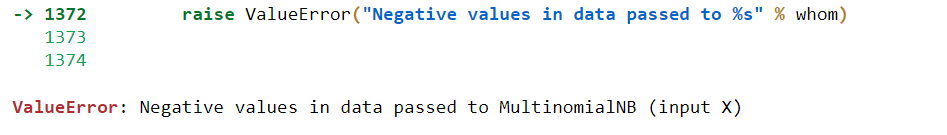

In [48]:
# Multinomial Naive Bayes
from sklearn.naive_bayes import MultinomialNB
model = MultinomialNB()
model.fit(x_train_scaled, y_train)

MultinomialNB()

In [49]:
model.score(x_test_scaled, y_test)

0.8333333333333334

Here, the accuracy is less since we have taken only 600 sample.    
If the same process is done with full dataset then the accuracy will be around 97%.

In [50]:
from sklearn.metrics import classification_report
y_pred = model.predict(x_test_scaled)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.79      0.92      0.85        60
           1       0.90      0.75      0.82        60

    accuracy                           0.83       120
   macro avg       0.84      0.83      0.83       120
weighted avg       0.84      0.83      0.83       120



In [51]:
# K-nearest Neighbours
from sklearn.neighbors import KNeighborsClassifier
model1 = KNeighborsClassifier()
model1.fit(x_train_scaled, y_train)
print("Accuracy :",model1.score(x_test_scaled, y_test))
y_pred = model1.predict(x_test_scaled)
print(classification_report(y_test,y_pred))

Accuracy : 0.925
              precision    recall  f1-score   support

           0       0.90      0.95      0.93        60
           1       0.95      0.90      0.92        60

    accuracy                           0.93       120
   macro avg       0.93      0.93      0.92       120
weighted avg       0.93      0.93      0.92       120



We can observe that KNN is performing better in this case since there is very less dimensionality vectors (i.e 300). In previous cases while using One-Hot encoding and TF-IDF, KNN performed worstly due to high dimensionality vectors.

# Exercise

**New Category Classification**     
labels : ['BUSINESS',  'SPORTS',  'CRIME']

In [52]:
import pandas as pd
import numpy as np

In [54]:
data = pd.read_json(r"D:\programming languages\datasets\News_Category_Dataset_v3.json", lines = True)
data

,link,headline,category,short_description,authors,date
0,https://www.huffpost.com/entry/covid-boosters-...,Over 4 Million Americans Roll Up Sleeves For O...,U.S. NEWS,Health experts said it is too early to predict...,"Carla K. Johnson, AP",2022-09-23
1,https://www.huffpost.com/entry/american-airlin...,"American Airlines Flyer Charged, Banned For Li...",U.S. NEWS,He was subdued by passengers and crew when he ...,Mary Papenfuss,2022-09-23
2,https://www.huffpost.com/entry/funniest-tweets...,23 Of The Funniest Tweets About Cats And Dogs ...,COMEDY,"""Until you have a dog you don't understand wha...",Elyse Wanshel,2022-09-23
3,https://www.huffpost.com/entry/funniest-parent...,The Funniest Tweets From Parents This Week (Se...,PARENTING,"""Accidentally put grown-up toothpaste on my to...",Caroline Bologna,2022-09-23
4,https://www.huffpost.com/entry/amy-cooper-lose...,Woman Who Called Cops On Black Bird-Watcher Lo...,U.S. NEWS,Amy Cooper accused investment firm Franklin Te...,Nina Golgowski,2022-09-22
...,...,...,...,...,...,...
209522,https://www.huffingtonpost.com/entry/rim-ceo-t...,RIM CEO Thorsten Heins' 'Significant' Plans Fo...,TECH,Verizon Wireless and AT&T are already promotin...,"Reuters, Reuters",2012-01-28
209523,https://www.huffingtonpost.com/entry/maria-sha...,Maria Sharapova Stunned By Victoria Azarenka I...,SPORTS,"Afterward, Azarenka, more effusive with the pr...",,2012-01-28
209524,https://www.huffingtonpost.com/entry/super-bow...,"Giants Over Patriots, Jets Over Colts Among M...",SPORTS,"Leading up to Super Bowl XLVI, the most talked...",,2012-01-28
209525,https://www.huffingtonpost.com/entry/aldon-smi...,Aldon Smith Arrested: 49ers Linebacker Busted ...,SPORTS,CORRECTION: An earlier version of this story i...,,2012-01-28


In [56]:
labels = ['BUSINESS', 'SPORTS', 'CRIME']
def get_sub_dataset(df,label_column, samples_per_class = 200):
    sub_df = pd.DataFrame()
    for class_label in labels:
        temp = df[df[label_column] == class_label].sample(samples_per_class)
        sub_df = pd.concat([sub_df,temp],axis = 0)
    return sub_df

In [58]:
sub_df = get_sub_dataset(data, 'category')
sub_df

,link,headline,category,short_description,authors,date
62580,https://www.huffingtonpost.com/entry/how-the-p...,How The Payment Industry Is Innovating In 2016,BUSINESS,,"AJ Agrawal, Contributor",2016-07-09
208810,https://www.huffingtonpost.com/entry/facebook-...,Facebook Is No Longer Cool,BUSINESS,Facebook and the billionaire Mark Zuckerberg h...,"Max Kolonko, Contributor\nNew York television ...",2012-02-05
91795,https://www.huffingtonpost.com/entry/why-compa...,Why Companies Should Respond When Twitter Rage...,BUSINESS,Clamming up could make things worse.,Jenny Che,2015-08-12
25978,https://www.huffingtonpost.com/entry/does-your...,Does Your Credit Card Offer Enough Travel Insu...,BUSINESS,Read your card coverage carefully when you mak...,"Christopher Elliott, ContributorAuthor, How to...",2017-09-04
71112,https://www.huffingtonpost.com/entry/alaska-ai...,Alaska Air Nears Deal To Acquire Virgin America,BUSINESS,Alaska Air is expected to pay upwards of $2 bi...,,2016-04-02
...,...,...,...,...,...,...
145179,https://www.huffingtonpost.com/entry/arapahoe-...,Karl Pierson ID'd As Arapahoe High School Shoo...,CRIME,Authorities have identified 18-year-old Karl P...,,2013-12-14
93465,https://www.huffingtonpost.com/entry/civilian-...,Civilian 'Guard' Fires Gun While 'Protecting' ...,CRIME,"Volunteer civilian ""guards"" have been kicked o...",Ed Mazza,2015-07-24
112842,https://www.huffingtonpost.com/entry/nyc-polic...,Police Union Doesn't Want Mayor At Cop Funerals,CRIME,,Simon McCormack,2014-12-13
92959,https://www.huffingtonpost.com/entry/sam-dubos...,What The Video Shows Vs. What The Officer Clai...,CRIME,The prosecutor says Ray Tensing's body cam vid...,Simon McCormack,2015-07-30


In [60]:
sub_df.category.value_counts()

BUSINESS    200
SPORTS      200
CRIME       200
Name: category, dtype: int64

In [62]:
sub_df['label_num'] = sub_df['category'].map({'BUSINESS':0,'SPORTS':1,'CRIME':3})
sub_df

,link,headline,category,short_description,authors,date,label_num
62580,https://www.huffingtonpost.com/entry/how-the-p...,How The Payment Industry Is Innovating In 2016,BUSINESS,,"AJ Agrawal, Contributor",2016-07-09,0
208810,https://www.huffingtonpost.com/entry/facebook-...,Facebook Is No Longer Cool,BUSINESS,Facebook and the billionaire Mark Zuckerberg h...,"Max Kolonko, Contributor\nNew York television ...",2012-02-05,0
91795,https://www.huffingtonpost.com/entry/why-compa...,Why Companies Should Respond When Twitter Rage...,BUSINESS,Clamming up could make things worse.,Jenny Che,2015-08-12,0
25978,https://www.huffingtonpost.com/entry/does-your...,Does Your Credit Card Offer Enough Travel Insu...,BUSINESS,Read your card coverage carefully when you mak...,"Christopher Elliott, ContributorAuthor, How to...",2017-09-04,0
71112,https://www.huffingtonpost.com/entry/alaska-ai...,Alaska Air Nears Deal To Acquire Virgin America,BUSINESS,Alaska Air is expected to pay upwards of $2 bi...,,2016-04-02,0
...,...,...,...,...,...,...,...
145179,https://www.huffingtonpost.com/entry/arapahoe-...,Karl Pierson ID'd As Arapahoe High School Shoo...,CRIME,Authorities have identified 18-year-old Karl P...,,2013-12-14,3
93465,https://www.huffingtonpost.com/entry/civilian-...,Civilian 'Guard' Fires Gun While 'Protecting' ...,CRIME,"Volunteer civilian ""guards"" have been kicked o...",Ed Mazza,2015-07-24,3
112842,https://www.huffingtonpost.com/entry/nyc-polic...,Police Union Doesn't Want Mayor At Cop Funerals,CRIME,,Simon McCormack,2014-12-13,3
92959,https://www.huffingtonpost.com/entry/sam-dubos...,What The Video Shows Vs. What The Officer Clai...,CRIME,The prosecutor says Ray Tensing's body cam vid...,Simon McCormack,2015-07-30,3


In [63]:
sub_df['text'] = sub_df['headline']+" "+sub_df['short_description']

In [64]:
sub_df['word_vectors'] = sub_df['text'].apply(lambda x : nlp(x).vector)

In [65]:
x = sub_df.word_vectors.values
y = sub_df.label_num

In [66]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.2, random_state = 3, stratify = y)

In [67]:
x_train_2d = np.stack(x_train)
x_test_2d = np.stack(x_test)

In [68]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
x_train_scaled = scaler.fit_transform(x_train_2d)
x_test_scaled = scaler.transform(x_test_2d)

In [69]:
# Multinomial naive bayes
from sklearn.naive_bayes import MultinomialNB
model = MultinomialNB()
model.fit(x_train_scaled, y_train)

MultinomialNB()

In [70]:
from sklearn.metrics import classification_report
print("Accuracy :",model.score(x_test_scaled, y_test))
y_pred = model.predict(x_test_scaled)
print(classification_report(y_test, y_pred))

Accuracy : 0.75
              precision    recall  f1-score   support

           0       0.69      0.82      0.75        40
           1       0.73      0.75      0.74        40
           3       0.87      0.68      0.76        40

    accuracy                           0.75       120
   macro avg       0.76      0.75      0.75       120
weighted avg       0.76      0.75      0.75       120



In [71]:
# K-nearest neighbors
from sklearn.neighbors import KNeighborsClassifier
model1 = KNeighborsClassifier()
model1.fit(x_train_scaled, y_train)
print("Accuracy :",model1.score(x_test_scaled, y_test))
y_pred = model1.predict(x_test_scaled)
print(classification_report(y_test, y_pred))

Accuracy : 0.7666666666666667
              precision    recall  f1-score   support

           0       0.75      0.75      0.75        40
           1       0.72      0.85      0.78        40
           3       0.85      0.70      0.77        40

    accuracy                           0.77       120
   macro avg       0.77      0.77      0.77       120
weighted avg       0.77      0.77      0.77       120



In [73]:
# Decision Tree
from sklearn.tree import DecisionTreeClassifier
model3 = DecisionTreeClassifier()
model3.fit(x_train_scaled, y_train)
print("Accuracy :",model3.score(x_test_scaled, y_test))
y_pred = model3.predict(x_test_scaled)
print(classification_report(y_test, y_pred))

Accuracy : 0.6083333333333333
              precision    recall  f1-score   support

           0       0.67      0.60      0.63        40
           1       0.63      0.65      0.64        40
           3       0.53      0.57      0.55        40

    accuracy                           0.61       120
   macro avg       0.61      0.61      0.61       120
weighted avg       0.61      0.61      0.61       120



In [72]:
# Random Forest
from sklearn.ensemble import RandomForestClassifier
model2 = RandomForestClassifier()
model2.fit(x_train_scaled, y_train)
print("Accuracy :",model2.score(x_test_scaled, y_test))
y_pred = model2.predict(x_test_scaled)
print(classification_report(y_test, y_pred))

Accuracy : 0.8333333333333334
              precision    recall  f1-score   support

           0       0.77      0.90      0.83        40
           1       0.85      0.82      0.84        40
           3       0.91      0.78      0.84        40

    accuracy                           0.83       120
   macro avg       0.84      0.83      0.83       120
weighted avg       0.84      0.83      0.83       120



We can observe that Random Forest is performing better in this case.